# scRNA velocity analysis

In [1]:
#import libs
import os
import scvelo as scv
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import statsmodels.graphics.mosaicplot as mplt
#import pyreader

In [2]:
scv.settings.verbosity = 3  # show errors(0), warnings(1), info(2), hints(3)
scv.settings.presenter_view = True  # set max width size for presenter view
scv.settings.set_figure_params('scvelo')  # for beautified visualization

In [3]:
# setting working directory
os.chdir("C:\\Users\\qaedi\\OneDrive - Queen's University\\Documents\\scRNA_velocity\\scvelo_files")

# SRR12603783 HG MIBC

In [4]:
# reading file
adata = scv.read("SRR12603783.h5ad")
adata

AnnData object with n_obs × n_vars = 6545 × 36601
    obs: 'orig.ident', 'nCount_spliced', 'nFeature_spliced', 'nCount_unspliced', 'nFeature_unspliced', 'nCount_ambiguous', 'nFeature_ambiguous', 'cells', 'gender', 'age', 'Grade', 'Invasiveness', 'clusters', 'nCount_RNA', 'nFeature_RNA', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.1', 'SCT_snn_res.0.2', 'SCT_snn_res.0.4', 'SCT_snn_res.0.6', 'SCT_snn_res.0.8', 'seurat_clusters', 'epi_cluster'
    var: 'features', 'ambiguous_features', 'spliced_features', 'unspliced_features'
    obsm: 'X_umap'
    layers: 'ambiguous', 'spliced', 'unspliced'

In [5]:
adata.obs.clusters.value_counts()

1    2626
4    2127
0     795
2     703
5     152
3     142
Name: clusters, dtype: int64

In [6]:
# Define a dictionary mapping the numbers to labels
label_mapping = {
    0: 'basal_cell',
    1: 'cancer_associated_luminal_cell',
    2: 'differentiated_luminal_cell',
    3: 'unique_luminal_cell',
    4: 'immunomodulatory_luminal_cell',
    5: 'adhesion_signaling_luminal_cell'
}

# Replace the numbers with their corresponding labels
adata.obs['clusters'] =adata.obs['clusters'].replace(label_mapping)
adata.obs['clusters'] = adata.obs['clusters'].astype('category')


saving figure to file ./figures/scvelo_proportions_basic_features_SRR12603783.png


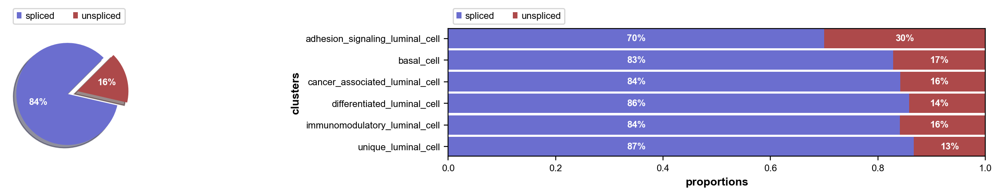

In [9]:
scv.pl.proportions(adata, figsize=(18,2), save= 'basic_features_SRR12603783.png')

## Basic preprocessing
After basic preprocessing (gene selection and normalization), we compute the first- and second-order moments (means and uncentered variances) for velocity estimation:

In [10]:
scv.pp.filter_and_normalize(adata, min_shared_counts=20, n_top_genes=2000)

Filtered out 31130 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.
Logarithmized X.


In [11]:
scv.pp.moments(adata, n_pcs=30, n_neighbors=30)

computing neighbors
    finished (0:00:06) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


## Velocity Tools _ dynamic model
The core of the software is the efficient and robust estimation of velocities, obtained with:

In [12]:
scv.tl.recover_dynamics(adata)
scv.tl.velocity(adata, mode='dynamical')
scv.tl.velocity_graph(adata)

recovering dynamics (using 1/16 cores)


  0%|          | 0/335 [00:00<?, ?gene/s]

    finished (0:03:31) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:01) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/16 cores)


  0%|          | 0/6545 [00:00<?, ?cells/s]

    finished (0:00:11) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:01) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
saving figure to file ./figures/scvelo_srr12603783_velocity_stream.png


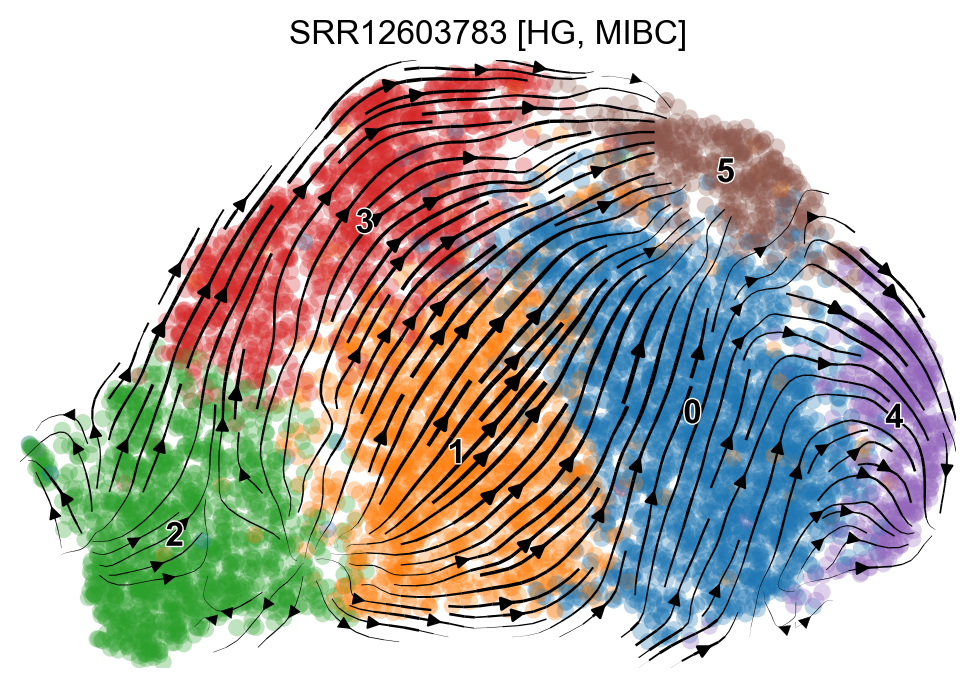

In [13]:
scv.pl.velocity_embedding_stream(adata, basis="umap", color="SCT_snn_res.0.4", title= 'SRR12603783 [HG, MIBC]', save= 'srr12603783_velocity_stream.png')

In [14]:
data = pd.crosstab(adata.obs['clusters'], adata.obs['SCT_snn_res.0.4']).transpose()
data

clusters,adhesion_signaling_luminal_cell,basal_cell,cancer_associated_luminal_cell,differentiated_luminal_cell,immunomodulatory_luminal_cell,unique_luminal_cell
SCT_snn_res.0.4,,,,,,
0,62,454,735,72,781,31
1,12,82,521,331,237,75
2,57,6,926,46,166,8
3,15,3,118,245,661,18
4,4,216,165,0,66,0
5,2,34,161,9,216,10


<Figure size 1000x600 with 0 Axes>

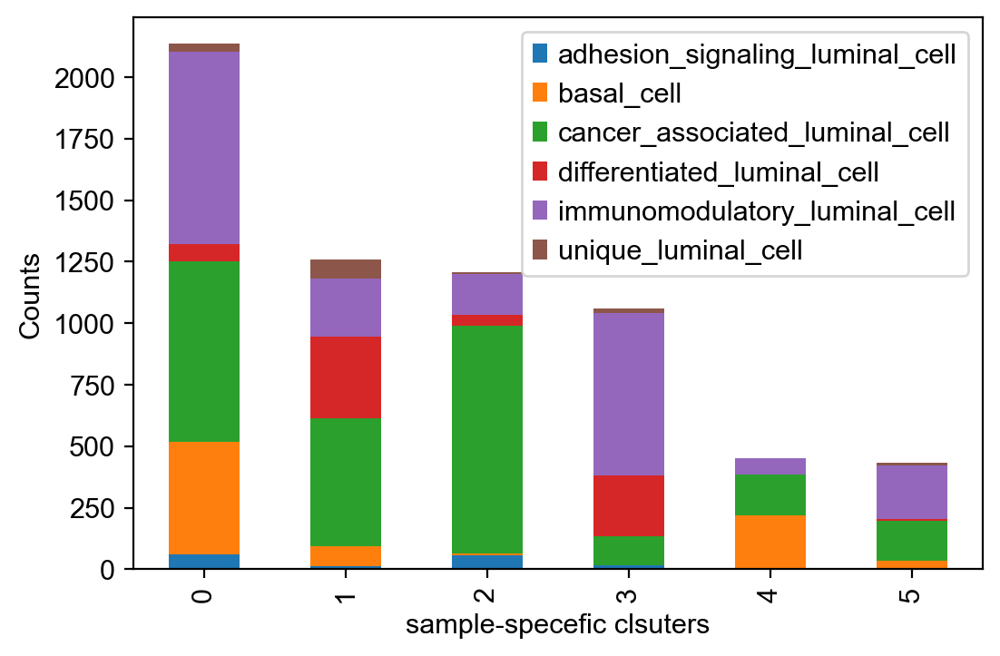

In [15]:
# Plot the stacked bar chart
plt.figure(figsize=(10, 6))
data.plot(kind='bar', stacked=True)
plt.xlabel('sample-specefic clsuters')
plt.ylabel('Counts')
plt.title('')
plt.legend(loc='upper right')
# Save the plot as an image file
plt.savefig('./figures/srr12603783_frequency_sample_clsuter_in_cell_clusters.png')

plt.show()

The most fine-grained resolution of the velocity vector field we get at single-cell level, with each arrow showing the direction and speed of movement of an individual cell.

saving figure to file ./figures/scvelo_srr12603783_velocity_embedding.png


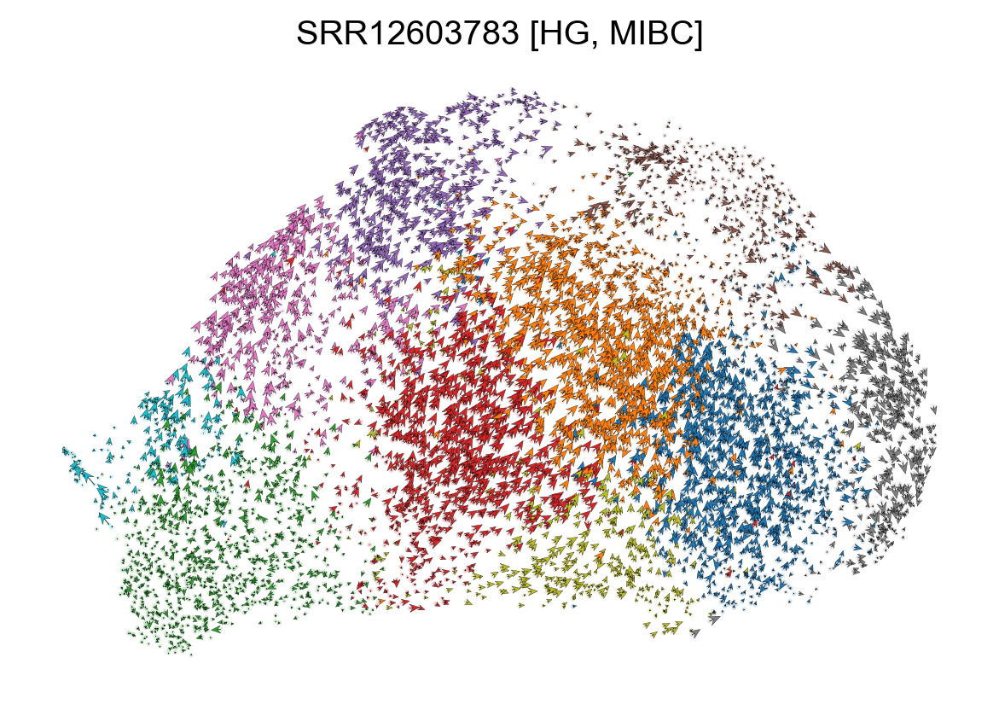

In [16]:
scv.pl.velocity_embedding(adata, basis="umap", color="seurat_clusters", arrow_length=3, arrow_size=2, dpi=120, title= 'SRR12603783 [HG, MIBC]', save= 'srr12603783_velocity_embedding.png')


## Latent time and top genes
The dynamical model recovers the latent time of the underlying cellular processes. This latent time represents the cell’s internal clock and approximates the real time experienced by cells as they differentiate, based only on its transcriptional dynamics.



computing terminal states
    identified 6 regions of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)


C:\Users\qaedi\anaconda3\lib\site-packages\scvelo\plotting\utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


saving figure to file ./figures/scvelo_srr12603783_latent_time.png


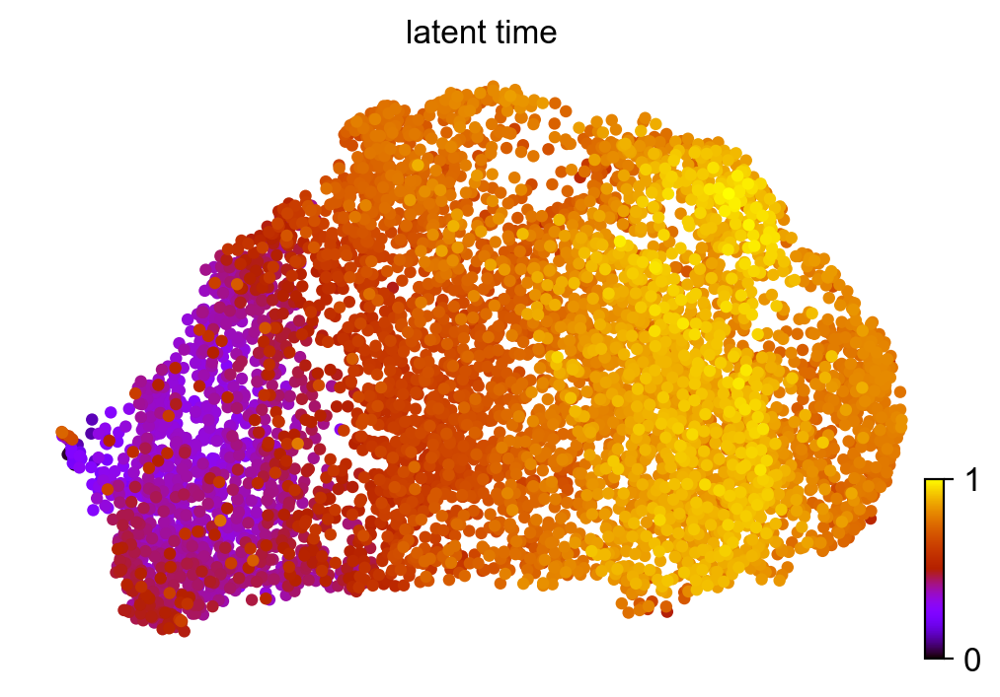

In [17]:
scv.tl.latent_time(adata)
scv.pl.scatter(adata, color='latent_time', color_map='gnuplot', size=80, save= "srr12603783_latent_time.png")

## Kinetic rate paramters
The rates of RNA transcription, splicing and degradation are estimated without the need of any experimental data.

They can be useful to better understand the cell identity and phenotypic heterogeneity.


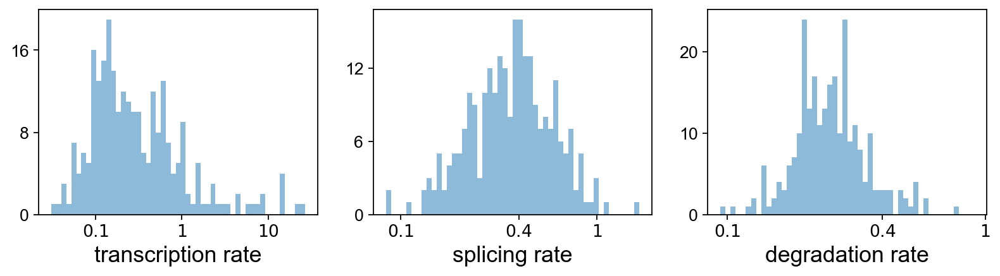

,fit_r2,fit_alpha,fit_beta,fit_gamma,fit_t_,fit_scaling,fit_std_u,fit_std_s,fit_likelihood,fit_u0,fit_s0,fit_pval_steady,fit_steady_u,fit_steady_s,fit_variance,fit_alignment_scaling
ENO1,0.170526,3.296458,13.728501,0.156885,7.864689,0.026324,0.081372,3.353864,0.219171,0.0,0.0,0.496356,0.237947,9.392603,1.058804,2.702026
CAMK2N1,0.094471,1.098705,16.866885,0.165689,7.069970,0.012907,0.018368,0.821829,0.181957,0.0,0.0,0.476764,0.057117,3.062095,1.389385,2.526427
GALE,0.039663,0.127367,2.923022,0.199394,7.737945,0.268056,0.020084,0.129809,0.138851,0.0,0.0,0.400852,0.067361,0.422462,2.089054,2.294053
EDN2,0.110540,0.805942,16.574118,0.347824,3.875601,0.035237,0.010551,0.403489,0.000004,0.0,0.0,0.468513,0.031373,1.050915,1.050940,1.977689
SLC2A1,0.548495,3.259899,15.706002,0.256389,12.335837,0.019384,0.046016,3.556889,0.339018,0.0,0.0,0.497239,0.153646,9.316565,0.391465,4.524540


In [18]:
df = adata.var
df = df[(df['fit_likelihood'] > .1) & df['velocity_genes'] == True]

kwargs = dict(xscale='log', fontsize=16)
with scv.GridSpec(ncols=3) as pl:
    pl.hist(df['fit_alpha'], xlabel='transcription rate', **kwargs)
    pl.hist(df['fit_beta'] * df['fit_scaling'], xlabel='splicing rate', xticks=[.1, .4, 1], **kwargs)
    pl.hist(df['fit_gamma'], xlabel='degradation rate', xticks=[.1, .4, 1], **kwargs)

scv.get_df(adata, 'fit*', dropna=True).head()



**fit_alpha (Transcription Rate)**: A high value indicates a high transcription rate, suggesting that the gene is actively transcribed, leading to higher mRNA production. Conversely, a low value suggests a lower transcription rate and potentially lower mRNA levels.

**fit_beta (Splicing Rate)**: A high value indicates a high splicing rate, implying that the gene undergoes frequent splicing, resulting in efficient production of mature mRNA. A low value suggests slower or less frequent splicing.

**fit_gamma (Degradation Rate)**: A high value suggests a rapid degradation rate for the gene's mRNA. This could result in lower mRNA abundance or shorter mRNA half-life. Conversely, a low value indicates a slower degradation rate and potentially higher mRNA stability.

**fit_t_ (Switching Time Point)**: A high value indicates a late switching time point, suggesting that the gene is activated or deactivated at a later stage of cellular differentiation or other biological processes. A low value suggests an early switching time point.

**fit_scaling (Scaling Parameter)**: A high value indicates a larger scaling factor used to adjust for under-represented unspliced reads. This suggests that the gene has a relatively higher number of unspliced transcripts compared to the rest of the dataset. A low value suggests a smaller scaling factor and potentially fewer unspliced transcripts.

**fit_std_u and fit_std_s (Standard Deviations)**: These columns represent the standard deviations of unspliced and spliced reads, respectively. A high value indicates greater variability or dispersion in the abundance of unspliced or spliced transcripts for the gene. Conversely, a low value suggests less variability.

**fit_likelihood**: A high value indicates a better fit of the dynamical model to the data for the gene, suggesting that the model accurately captures the transcriptional dynamics. A low value suggests a poorer fit and potential discrepancies between the model and the actual data.

**fit_steady_u and fit_steady_s (Steady-State Levels)**: A high value in either column indicates a higher abundance of the respective transcript type (unspliced or spliced) at the steady state. This suggests a potentially important role for the gene in maintaining stable expression levels. A low value indicates lower steady-state levels.

**fit_pval_steady_u and fit_pval_steady_s (P-values for Steady-State Levels)**: A high value in either column indicates a significant difference in the steady-state levels compared to a reference or null hypothesis. This suggests that the gene's expression at the steady state is distinct and potentially regulated differently. A low value suggests no significant difference.

**fit_variance**: A high value indicates greater variability or uncertainty in the estimated parameters and transcriptional dynamics for the gene. This could be due to complex regulation or heterogeneity. A low value suggests lower variability and more consistent behavior.

**fit_alignment_scaling**: A high value indicates a larger scaling factor used to align the gene-wise latent times to a universal, gene-shared latent time. This suggests a more substantial deviation from the shared latent time in the dynamical model. A low value indicates a smaller deviation and closer alignment to the shared latent time.

In our analysis of bladder cancer, we focused on five specific genes: EDN2, SLC2A1, GBP1, S100A2, and MUC1. These genes play important roles in the transcriptional dynamics and splicing kinetics of bladder cancer cells.

**EDN2**, while showing moderate values in most parameters, may still have relevance in bladder cancer development. Its transcription rate (fit_alpha) and splicing rate (fit_beta) indicate that it contributes to the regulation of gene expression in the context of bladder cancer. Although its impact may not be as strong as other genes, it could still play a role in the disease.

**SLC2A1**, on the other hand, exhibits higher values in multiple parameters. Its elevated transcription rate and splicing rate suggest that SLC2A1 is actively transcribed and spliced in bladder cancer cells. This gene's expression levels may vary significantly, indicating its involvement in the disease process.

**GBP1**, with low to moderate values across most parameters, may have a less prominent role in bladder cancer development compared to other genes. Its relatively low transcription rate and splicing rate suggest a lesser impact on the transcriptional dynamics. However, further studies are needed to determine its specific role in bladder cancer.

**S100A2** emerges as a gene with high values in multiple parameters, indicating its potential significance in bladder cancer. The elevated transcription rate, splicing rate, and standard deviation of spliced reads suggest that S100A2 plays a crucial role in the transcriptional dynamics and splicing kinetics of bladder cancer cells. Its high likelihood and steady-state levels further support its involvement in the disease development.

**MUC1**, similar to EDN2, exhibits low to moderate values in most parameters. Its relatively low transcription rate and splicing rate suggest a lesser impact on the transcriptional dynamics in bladder cancer. While MUC1 may not be as pronounced as other genes in the list, it could still have some influence on the disease.

Overall, our analysis suggests that S100A2 is a key gene in bladder cancer development due to its high values in various parameters related to transcription and splicing. The other genes, including EDN2, SLC2A1, GBP1, and MUC1, may also contribute to the disease but to a lesser extent. Further investigation and experimental validation are necessary to fully understand the roles of these genes in bladder cancer and their potential as therapeutic targets or biomarkers.

saving figure to file ./figures/scvelo_heatmap_srr12603783_top_genes_kinetic_parameters.png


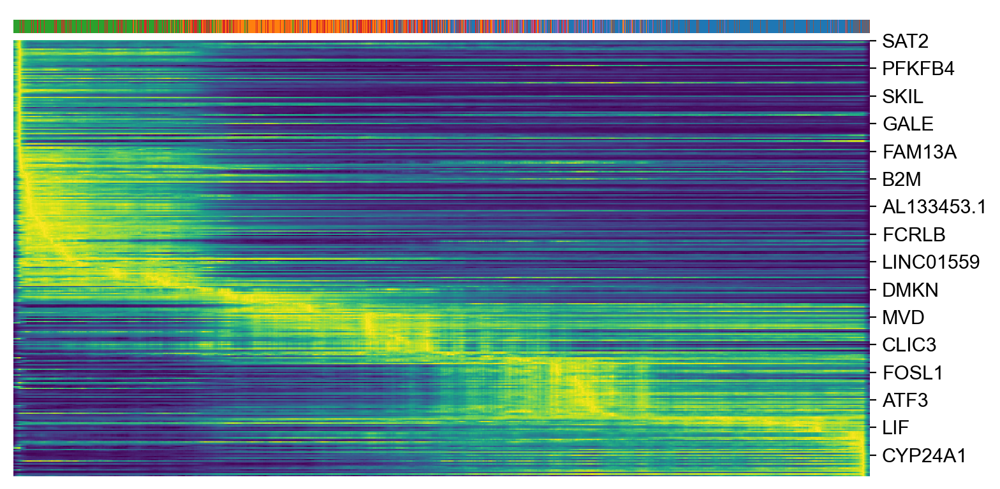

In [20]:
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index[:300]
scv.pl.heatmap(adata, var_names=top_genes, sortby='latent_time', col_color="SCT_snn_res.0.4", n_convolve=100 ,colorbar=True, save= "srr12603783_top_genes_kinetic_parameters.png")

## Cluster-specific top-likelihood genes

Driver genes display pronounced dynamic behavior and are systematically detected via their characterization by high likelihoods in the dynamic model.

In [43]:
scv.tl.rank_dynamical_genes(adata, groupby='SCT_snn_res.0.4')
df = scv.get_df(adata, 'rank_dynamical_genes/names')
df.head(5)

ranking genes by cluster-specific likelihoods
    finished (0:00:01) --> added 
    'rank_dynamical_genes', sorted scores by group ids (adata.uns)


,0,1,2,3,4,5
0,NFKBIA,LDHA,ADIRF,LDHA,HSPA8,HSPA8
1,ADIRF,FOS,FOS,HSPA8,CCT2,NFKBIA
2,HSPA8,HSPA8,LDHA,NDRG1,BHLHE40,ADIRF
3,ATF3,ADIRF,FCRLB,CCT2,CNOT2,HPGD
4,HPGD,CCT2,HS3ST1,FOS,ACTG1,ATF3


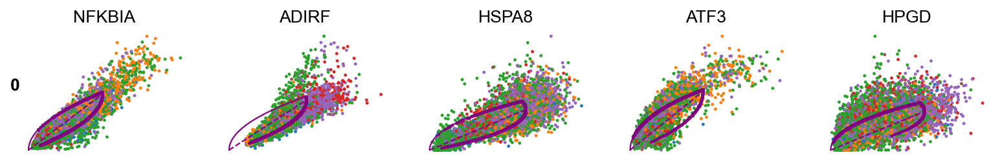

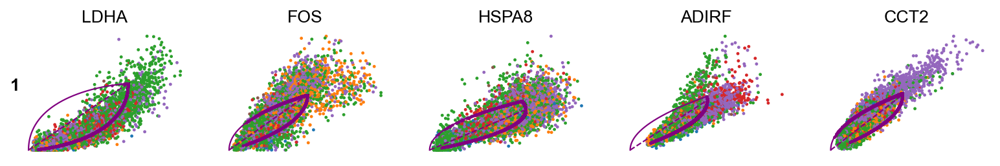

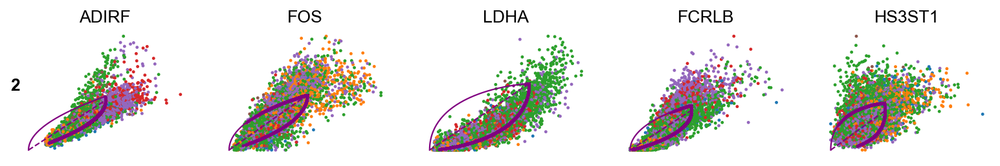

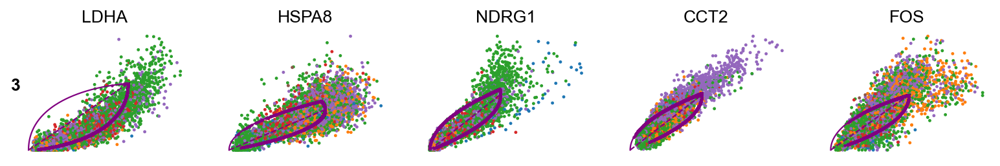

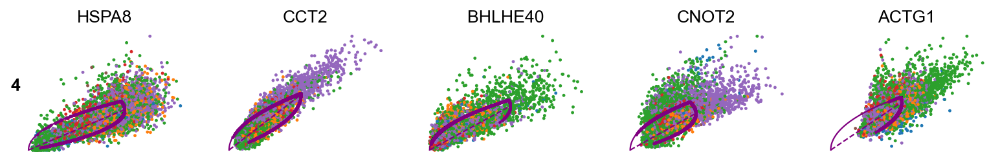

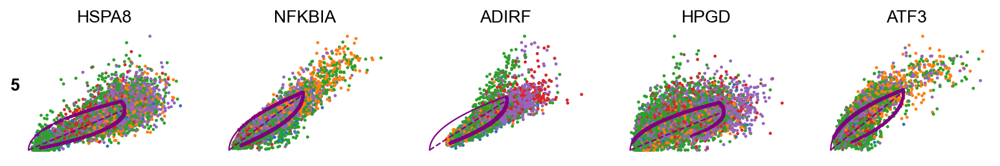

In [45]:
for cluster in ['0', '1', '2', '3', '4', '5']:
    scv.pl.scatter(adata, df[cluster][:5], ylabel=cluster, frameon=False)

C:\Users\qaedi\anaconda3\lib\site-packages\scvelo\plotting\utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()
C:\Users\qaedi\anaconda3\lib\site-packages\scvelo\plotting\utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()
C:\Users\qaedi\anaconda3\lib\site-packages\scvelo\plotting\utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()
C:\Users\qaedi\anaconda3\lib\site-packages\scvelo\plotting\utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.dr

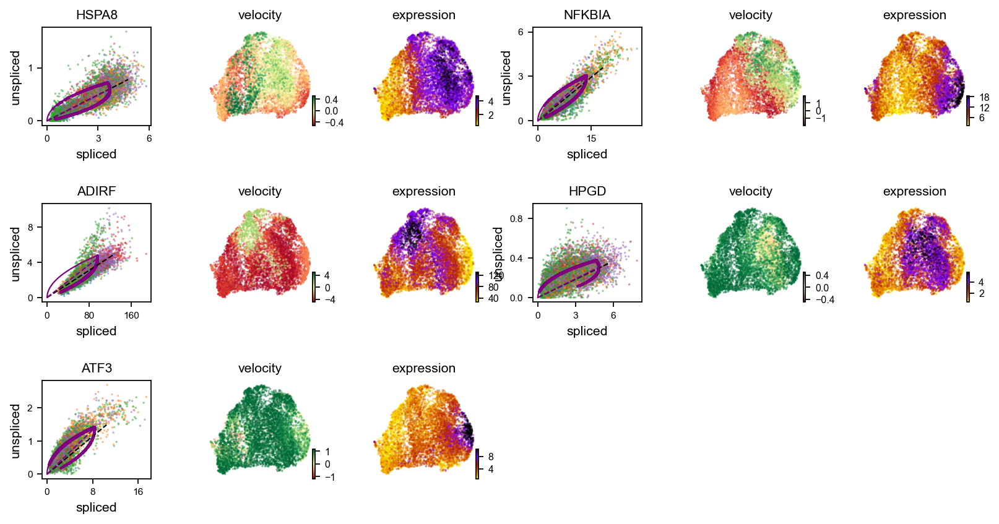

In [64]:
scv.pl.velocity(adata, ['HSPA8',  'NFKBIA', 'ADIRF', 'HPGD', 'ATF3'], ncols=2, figsize=(20,20))

C:\Users\qaedi\anaconda3\lib\site-packages\scvelo\plotting\utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


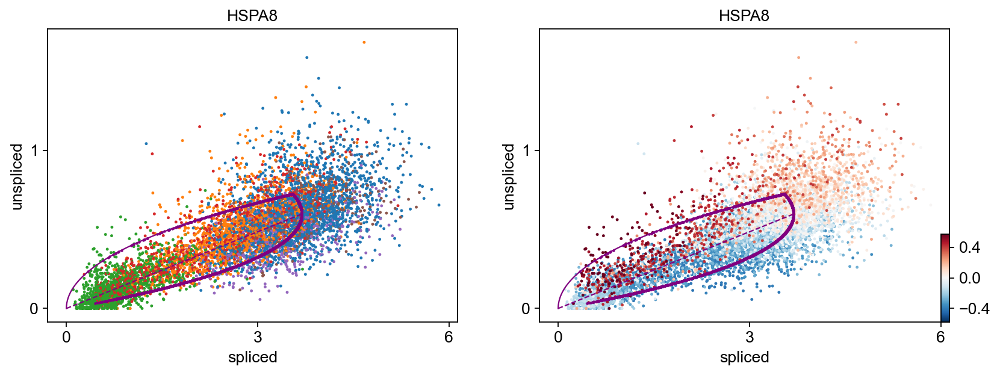

In [65]:
# scatter plot
scv.pl.scatter(adata, 'HSPA8', color=['SCT_snn_res.0.4', 'velocity'])

C:\Users\qaedi\anaconda3\lib\site-packages\scvelo\plotting\utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


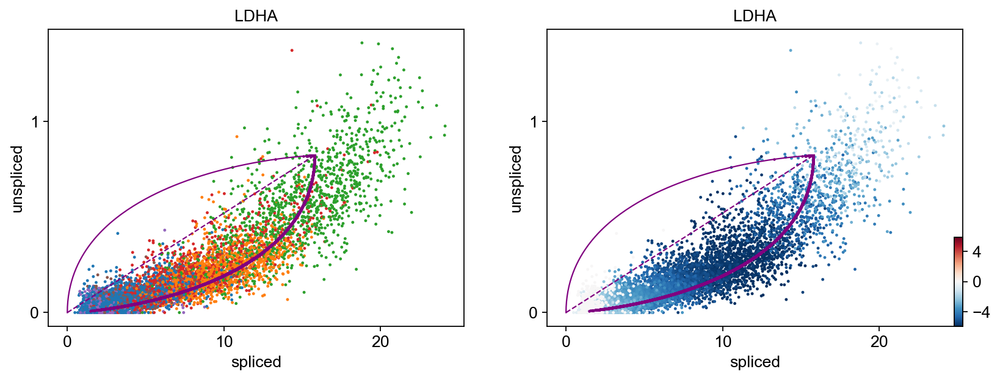

In [67]:
# scatter plot
scv.pl.scatter(adata, 'LDHA', color=['SCT_snn_res.0.4', 'velocity'])

C:\Users\qaedi\anaconda3\lib\site-packages\scvelo\plotting\utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


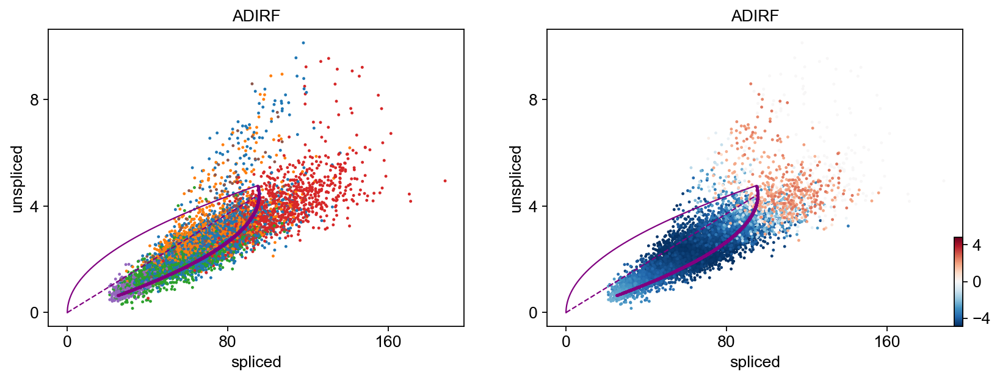

In [69]:
# scatter plot
scv.pl.scatter(adata, 'ADIRF', color=['SCT_snn_res.0.4', 'velocity'])

C:\Users\qaedi\anaconda3\lib\site-packages\scvelo\plotting\utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


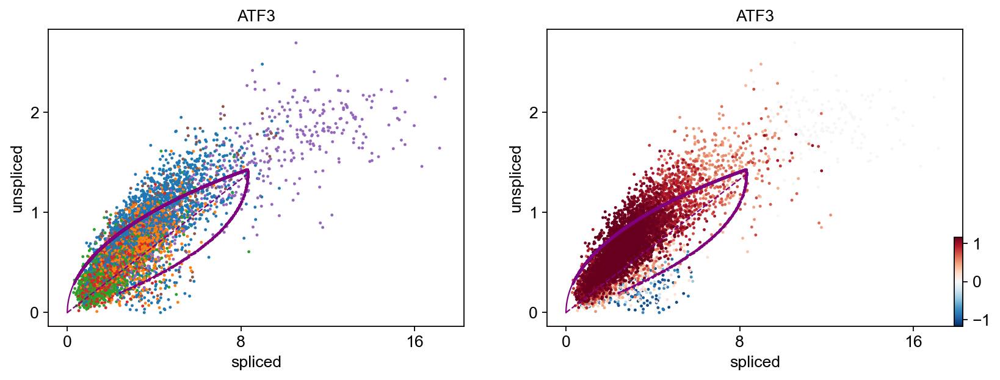

In [70]:
# scatter plot
scv.pl.scatter(adata, 'ATF3', color=['SCT_snn_res.0.4', 'velocity'])

# SRR12603784 HG MIBC

In [4]:
# reading file
adata = scv.read("SRR12603784.h5ad")
# Define a dictionary mapping the numbers to labels
label_mapping = {
    0: 'basal_cell',
    1: 'cancer_associated_luminal_cell',
    2: 'differentiated_luminal_cell',
    3: 'unique_luminal_cell',
    4: 'immunomodulatory_luminal_cell',
    5: 'adhesion_signaling_luminal_cell'
}

# Replace the numbers with their corresponding labels
adata.obs['clusters'] =adata.obs['clusters'].replace(label_mapping)
scv.pp.filter_and_normalize(adata, min_shared_counts=20, n_top_genes=2000)
scv.pp.moments(adata, n_pcs=30, n_neighbors=30)


scv.tl.recover_dynamics(adata)
scv.tl.velocity(adata, mode='dynamical')
scv.tl.velocity_graph(adata)
#print(pd.crosstab(adata.obs['clusters'], adata.obs['SCT_snn_res.0.1']))
#print(pd.crosstab(adata.obs['clusters'], adata.obs['SCT_snn_res.0.2']))
print(pd.crosstab(adata.obs['clusters'], adata.obs['SCT_snn_res.0.4']))



Filtered out 30402 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.
Logarithmized X.
computing neighbors
    finished (0:00:07) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics (using 1/16 cores)


  0%|          | 0/280 [00:00<?, ?gene/s]

    finished (0:03:59) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:01) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/16 cores)


  0%|          | 0/6461 [00:00<?, ?cells/s]

    finished (0:00:10) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
SCT_snn_res.0.4                     0     1    2    3   4   5   6
clusters                                                         
adhesion_signaling_luminal_cell   331    49  460   66  13  11   0
basal_cell                        203  1318  482  215  84  30   0
cancer_associated_luminal_cell    126   100   44   23   6   5   0
differentiated_luminal_cell       197     5  209  159  12   8   3
immunomodulatory_luminal_cell     341     0  122  283  57  67  41
unique_luminal_cell              1105     8  120  108  32  18   0


<Figure size 1000x600 with 0 Axes>

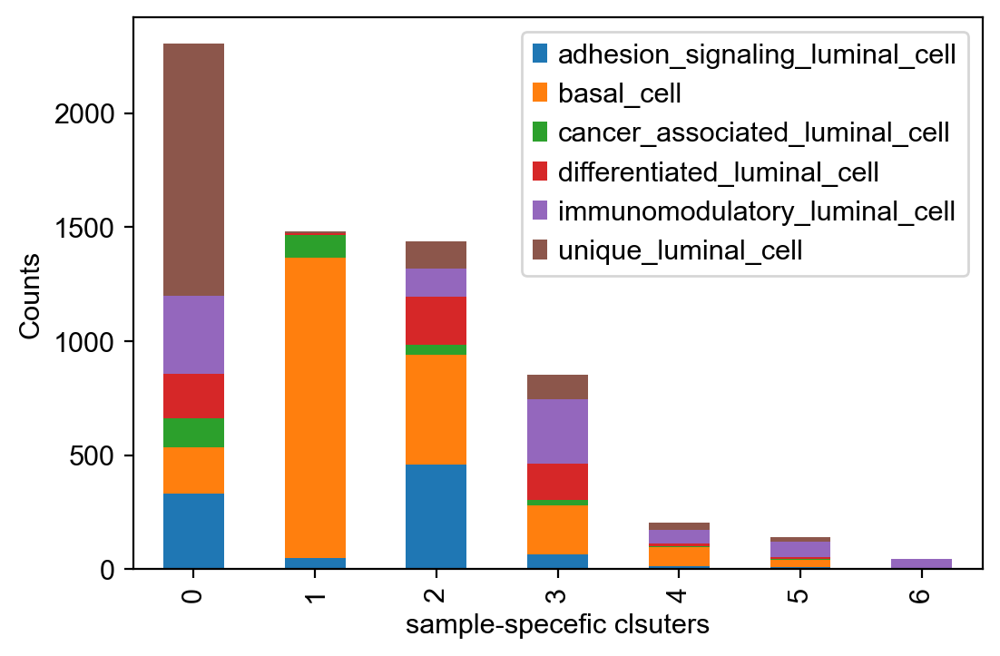

In [5]:
data = pd.crosstab(adata.obs['clusters'], adata.obs['SCT_snn_res.0.4']).transpose()

# Plot the stacked bar chart
plt.figure(figsize=(10, 6))
data.plot(kind='bar', stacked=True)
plt.xlabel('sample-specefic clsuters')
plt.ylabel('Counts')
plt.title('')
plt.legend(loc='upper right')
# Save the plot as an image file
plt.savefig('./figures/srr12603784_frequency_sample_clsuter_in_cell_clusters.png')

plt.show()

computing velocity embedding
    finished (0:00:01) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
saving figure to file ./figures/scvelo_srr12603784_velocity_stream.png


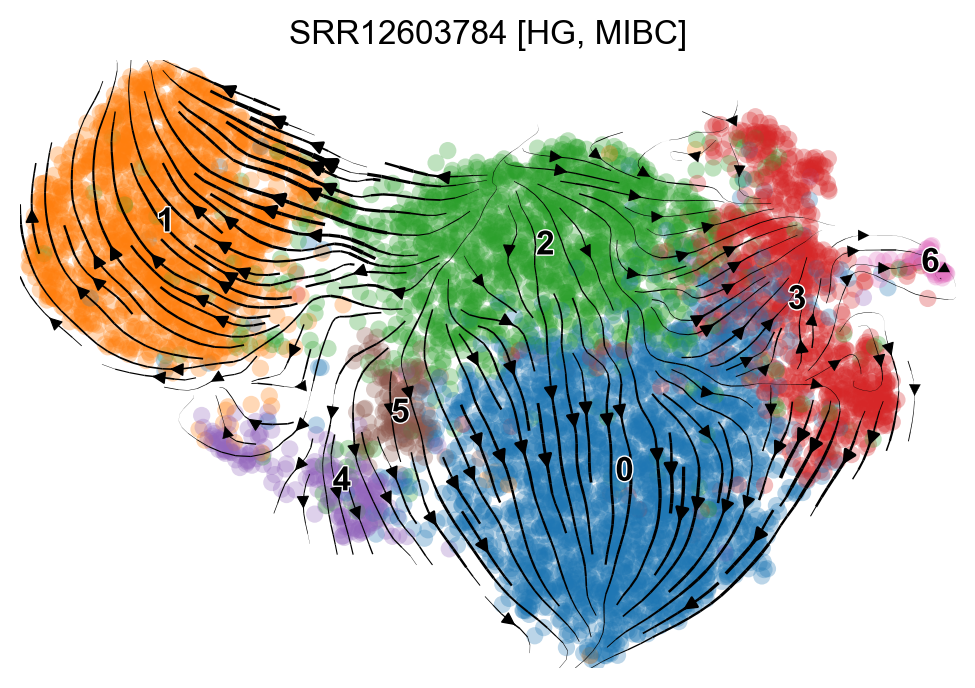

In [6]:
scv.pl.velocity_embedding_stream(adata, basis="umap", color="SCT_snn_res.0.4", title= 'SRR12603784 [HG, MIBC]', save= 'srr12603784_velocity_stream.png')

computing terminal states
    identified 2 regions of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)


C:\Users\qaedi\anaconda3\lib\site-packages\scvelo\plotting\utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


saving figure to file ./figures/scvelo_srr12603784_latent_time.png


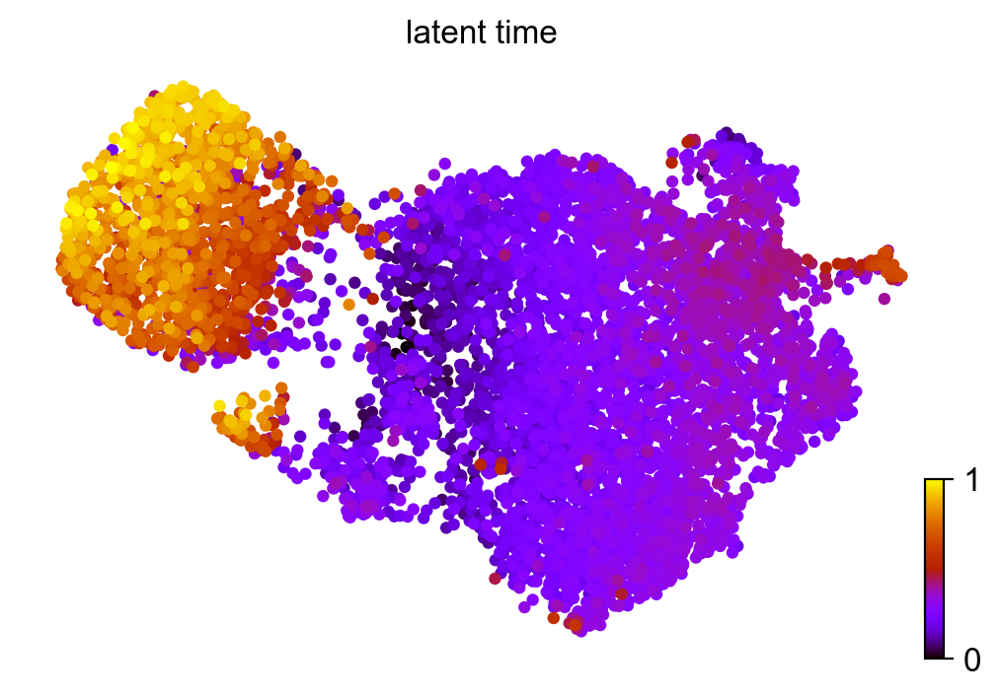

In [7]:
#latent time analysis
scv.tl.latent_time(adata)
scv.pl.scatter(adata, color='latent_time', color_map='gnuplot', size=80, save= "srr12603784_latent_time.png")

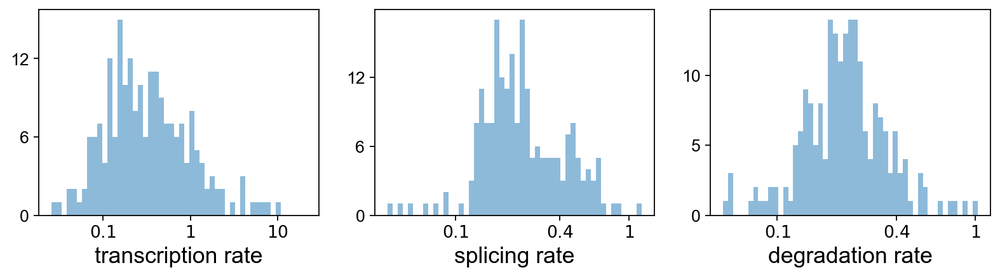

,fit_r2,fit_alpha,fit_beta,fit_gamma,fit_t_,fit_scaling,fit_std_u,fit_std_s,fit_likelihood,fit_u0,fit_s0,fit_pval_steady,fit_steady_u,fit_steady_s,fit_variance,fit_alignment_scaling
SPOCD1,0.258545,0.119151,1.014725,0.259976,11.124379,0.392200,0.037183,0.116137,0.207890,0.0,0.0,0.343696,0.114683,0.353971,1.116562,2.784930
GCLM,0.278761,0.069663,0.185900,0.234671,9.640716,3.492074,0.139857,0.069386,0.185517,0.0,0.0,0.337408,0.445703,0.218312,1.527636,2.668771
HMGCS2,0.045980,0.478281,13.370479,0.314213,5.966753,0.023691,0.011806,0.235467,0.155791,0.0,0.0,0.432345,0.037913,0.879990,1.567131,1.420622
ANP32E,0.086126,0.120025,1.726698,0.166721,10.439544,0.082732,0.022035,0.125846,0.139825,0.0,0.0,0.385287,0.072274,0.428461,2.103073,2.976839
MCL1,0.025569,0.483103,6.963561,0.112964,13.048353,0.022438,0.020168,0.424701,0.137360,0.0,0.0,0.485724,0.073256,2.315762,2.459775,2.880003


In [8]:
# Kinetic rate parameters
df = adata.var
df = df[(df['fit_likelihood'] > .1) & df['velocity_genes'] == True]

kwargs = dict(xscale='log', fontsize=16)
with scv.GridSpec(ncols=3) as pl:
    pl.hist(df['fit_alpha'], xlabel='transcription rate', **kwargs)
    pl.hist(df['fit_beta'] * df['fit_scaling'], xlabel='splicing rate', xticks=[.1, .4, 1], **kwargs)
    pl.hist(df['fit_gamma'], xlabel='degradation rate', xticks=[.1, .4, 1], **kwargs)

scv.get_df(adata, 'fit*', dropna=True).head()

saving figure to file ./figures/scvelo_heatmap_srr12603784_top_genes_kinetic_parameters.png


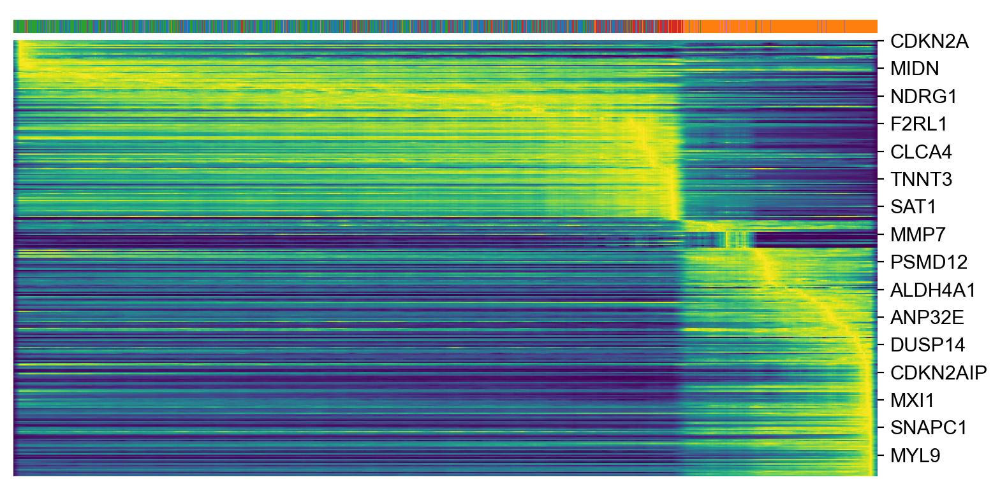

In [9]:
# top genes
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index[:300]
scv.pl.heatmap(adata, var_names=top_genes, sortby='latent_time', col_color="SCT_snn_res.0.4", n_convolve=100 ,colorbar=True, save= "srr12603784_top_genes_kinetic_parameters.png")

In [10]:
# reading file
adata = scv.read("SRR12603782.h5ad")
# Define a dictionary mapping the numbers to labels
label_mapping = {
    0: 'basal_cell',
    1: 'cancer_associated_luminal_cell',
    2: 'differentiated_luminal_cell',
    3: 'unique_luminal_cell',
    4: 'immunomodulatory_luminal_cell',
    5: 'adhesion_signaling_luminal_cell'
}

# Replace the numbers with their corresponding labels
adata.obs['clusters'] =adata.obs['clusters'].replace(label_mapping)
scv.pp.filter_and_normalize(adata, min_shared_counts=20, n_top_genes=2000)
scv.pp.moments(adata, n_pcs=30, n_neighbors=30)


scv.tl.recover_dynamics(adata)
scv.tl.velocity(adata, mode='dynamical')
scv.tl.velocity_graph(adata)
print(pd.crosstab(adata.obs['clusters'], adata.obs['SCT_snn_res.0.1']))
print(pd.crosstab(adata.obs['clusters'], adata.obs['SCT_snn_res.0.2']))
print(pd.crosstab(adata.obs['clusters'], adata.obs['SCT_snn_res.0.4']))


Filtered out 28844 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.
Logarithmized X.
computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics (using 1/16 cores)


  0%|          | 0/378 [00:00<?, ?gene/s]

    finished (0:03:59) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:01) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/16 cores)


  0%|          | 0/5631 [00:00<?, ?cells/s]

    finished (0:00:09) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
SCT_snn_res.0.1                     0    1    2   3
clusters                                           
adhesion_signaling_luminal_cell   258   10    1  29
basal_cell                       1082  218    9  23
cancer_associated_luminal_cell    372    7  209  78
differentiated_luminal_cell      1463   20   12  12
immunomodulatory_luminal_cell     189   78    1  10
unique_luminal_cell              1444   20   66  20
SCT_snn_res.0.2                     0    1    2    3   4   5
clusters                                                    
adhesion_signaling_luminal_cell    42  216    1    6  29   4
basal_cell                        258  824    9  132  23  86
cancer_associated_luminal_cell    265  105  211    2  78   5
differentiated_luminal_cell       816  645   14    5  12  15
immunomodulatory_luminal_cell      75  115    1   56  10  21
unique_luminal_cell              1293  151   66   

<Figure size 1000x600 with 0 Axes>

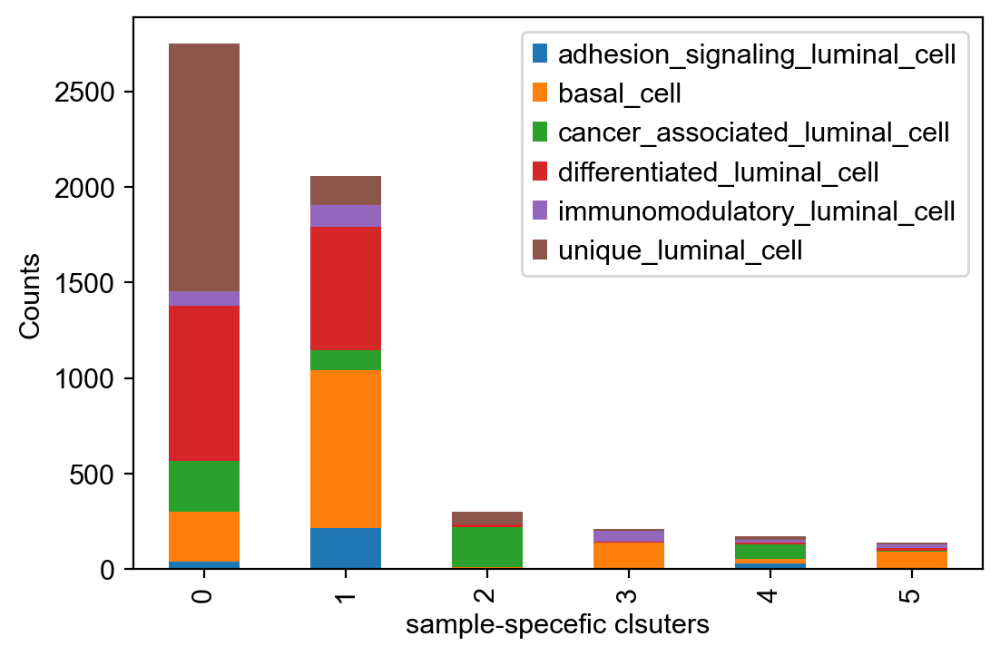

In [17]:
data = pd.crosstab(adata.obs['clusters'], adata.obs['SCT_snn_res.0.2']).transpose()

# Plot the stacked bar chart
plt.figure(figsize=(10, 6))
data.plot(kind='bar', stacked=True)
plt.xlabel('sample-specefic clsuters')
plt.ylabel('Counts')
plt.title('')
plt.legend(loc='upper right')
# Save the plot as an image file
plt.savefig('./figures/srr12603782_frequency_sample_clsuter_in_cell_clusters.png')

plt.show()

saving figure to file ./figures/scvelo_srr12603782_velocity_stream.png


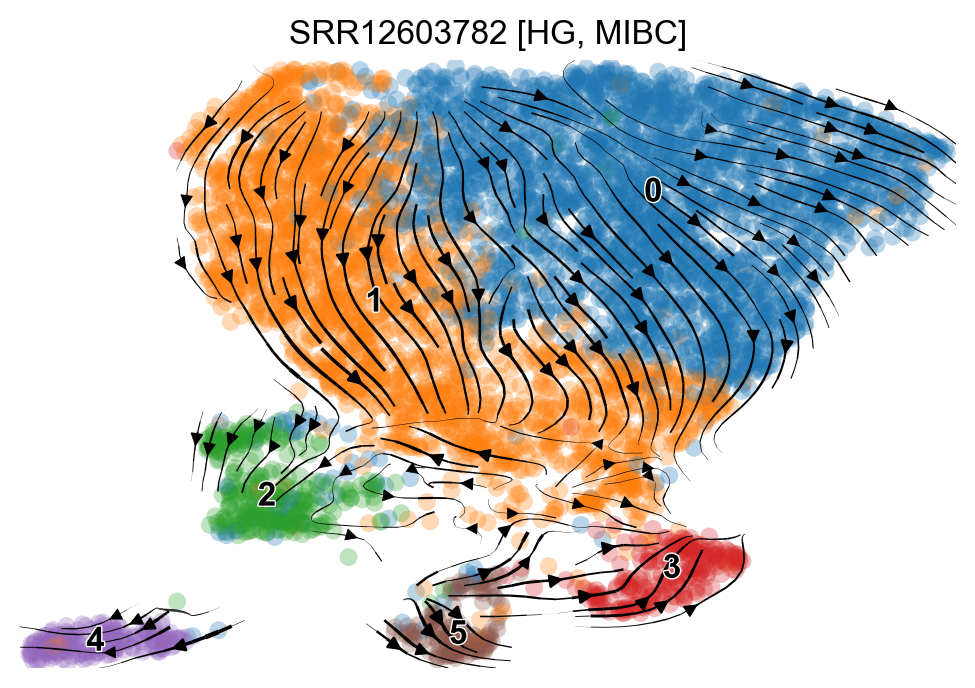

In [18]:
scv.pl.velocity_embedding_stream(adata, basis="umap", color="SCT_snn_res.0.2", title= 'SRR12603782 [HG, MIBC]', save= 'srr12603782_velocity_stream.png')

computing latent time using root_cells as prior
    finished (0:00:01) --> added 
    'latent_time', shared time (adata.obs)


C:\Users\qaedi\anaconda3\lib\site-packages\scvelo\plotting\utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


saving figure to file ./figures/scvelo_srr12603782_latent_time.png


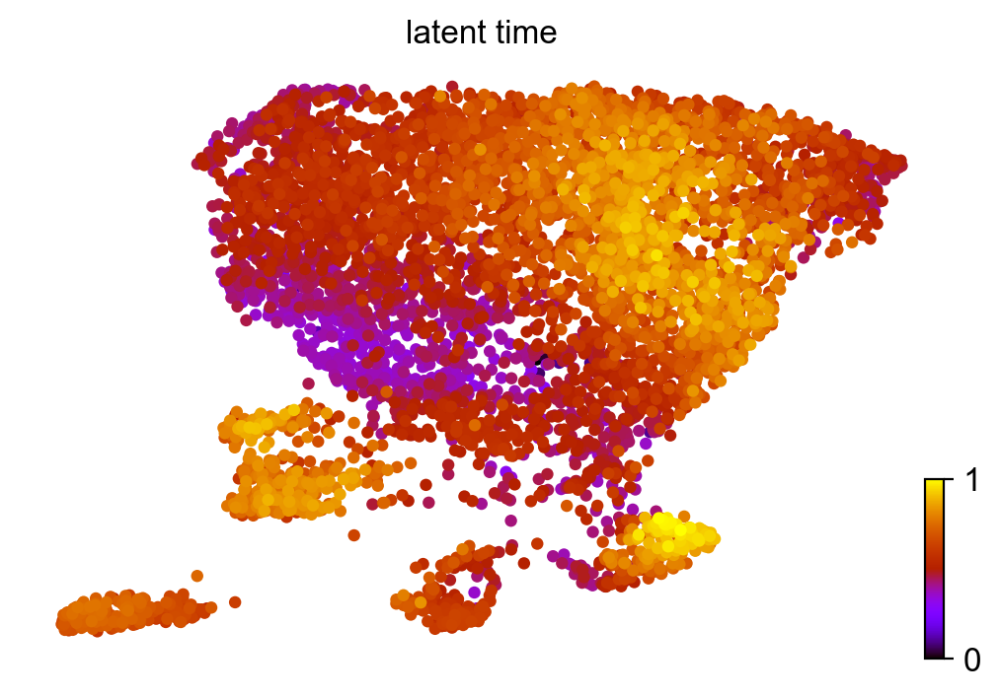

In [19]:
#latent time analysis
scv.tl.latent_time(adata)
scv.pl.scatter(adata, color='latent_time', color_map='gnuplot', size=80, save= "srr12603782_latent_time.png")

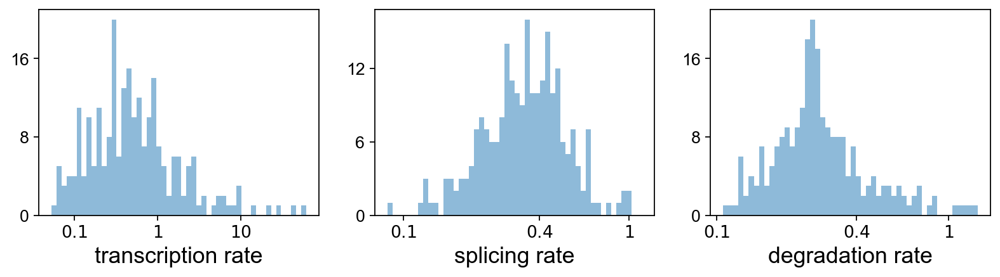

,fit_r2,fit_alpha,fit_beta,fit_gamma,fit_t_,fit_scaling,fit_std_u,fit_std_s,fit_likelihood,fit_u0,fit_s0,fit_pval_steady,fit_steady_u,fit_steady_s,fit_variance,fit_alignment_scaling
DHRS3,0.373754,0.862702,0.677078,0.382437,11.081132,0.318272,0.244585,0.383812,0.220173,0.0,0.0,0.456166,0.961512,1.626923,1.042225,2.184024
BX284668.5,0.034137,0.145756,1.822482,0.180676,11.680560,0.187952,0.031589,0.176473,0.115347,0.0,0.0,0.464929,0.139857,0.763879,3.492864,3.180297
CAMK2N1,0.043716,2.774987,29.961616,0.256148,8.427426,0.006055,0.024778,1.933586,0.213712,0.0,0.0,0.485455,0.080382,5.974348,1.209441,2.480502
RAP1GAP,0.139464,0.096133,0.609009,0.270654,10.701406,0.726615,0.056790,0.105316,0.245617,0.0,0.0,0.191967,0.160488,0.317243,0.849681,2.900086
MYCL,0.054805,1.508293,11.329932,0.294004,9.560742,0.042447,0.044307,1.236059,0.219727,0.0,0.0,0.471740,0.131016,4.590173,0.786771,2.110517


In [20]:
# Kinetic rate parameters
df = adata.var
df = df[(df['fit_likelihood'] > .1) & df['velocity_genes'] == True]

kwargs = dict(xscale='log', fontsize=16)
with scv.GridSpec(ncols=3) as pl:
    pl.hist(df['fit_alpha'], xlabel='transcription rate', **kwargs)
    pl.hist(df['fit_beta'] * df['fit_scaling'], xlabel='splicing rate', xticks=[.1, .4, 1], **kwargs)
    pl.hist(df['fit_gamma'], xlabel='degradation rate', xticks=[.1, .4, 1], **kwargs)

scv.get_df(adata, 'fit*', dropna=True).head()

saving figure to file ./figures/scvelo_heatmap_srr12603782_top_genes_kinetic_parameters.png


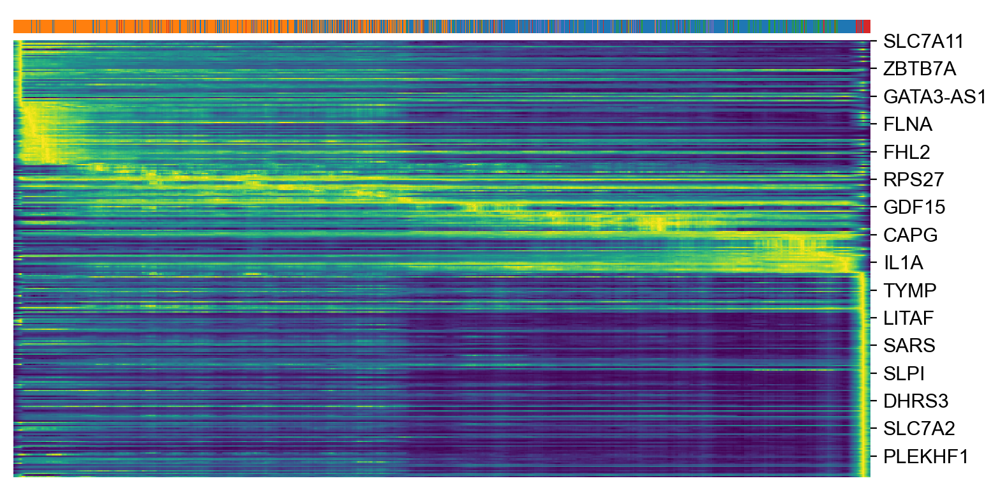

In [21]:
# top genes
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index[:300]
scv.pl.heatmap(adata, var_names=top_genes, sortby='latent_time', col_color="SCT_snn_res.0.2", n_convolve=100 ,colorbar=True, save= "srr12603782_top_genes_kinetic_parameters.png")

In [22]:
# reading file
adata = scv.read("SRR12603785.h5ad")
# Define a dictionary mapping the numbers to labels
label_mapping = {
    0: 'basal_cell',
    1: 'cancer_associated_luminal_cell',
    2: 'differentiated_luminal_cell',
    3: 'unique_luminal_cell',
    4: 'immunomodulatory_luminal_cell',
    5: 'adhesion_signaling_luminal_cell'
}

# Replace the numbers with their corresponding labels
adata.obs['clusters'] =adata.obs['clusters'].replace(label_mapping)
scv.pp.filter_and_normalize(adata, min_shared_counts=20, n_top_genes=2000)
scv.pp.moments(adata, n_pcs=30, n_neighbors=30)


scv.tl.recover_dynamics(adata)
scv.tl.velocity(adata, mode='dynamical')
scv.tl.velocity_graph(adata)
print(pd.crosstab(adata.obs['clusters'], adata.obs['SCT_snn_res.0.1']))
print(pd.crosstab(adata.obs['clusters'], adata.obs['SCT_snn_res.0.2']))
print(pd.crosstab(adata.obs['clusters'], adata.obs['SCT_snn_res.0.4']))


Filtered out 29100 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.
Logarithmized X.
computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics (using 1/16 cores)


  0%|          | 0/375 [00:00<?, ?gene/s]

    finished (0:02:22) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:01) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/16 cores)


  0%|          | 0/3226 [00:00<?, ?cells/s]

    finished (0:00:04) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
SCT_snn_res.0.1                     0    1    2   3    4
clusters                                                
adhesion_signaling_luminal_cell   224    1   18   0    1
basal_cell                        540    9  164   6    4
cancer_associated_luminal_cell   1101  204   15  82  117
differentiated_luminal_cell       256  172    2  77    1
immunomodulatory_luminal_cell      55    5    2   6    0
unique_luminal_cell               156    3    0   2    3
SCT_snn_res.0.2                     0    1    2    3   4    5
clusters                                                     
adhesion_signaling_luminal_cell   214    1   18   10   0    1
basal_cell                        350    9  168  186   6    4
cancer_associated_luminal_cell   1089  205   17    9  82  117
differentiated_luminal_cell       252  172    4    2  77    1
immunomodulatory_luminal_cell      55    5    2    0   6    0
uni

<Figure size 1000x600 with 0 Axes>

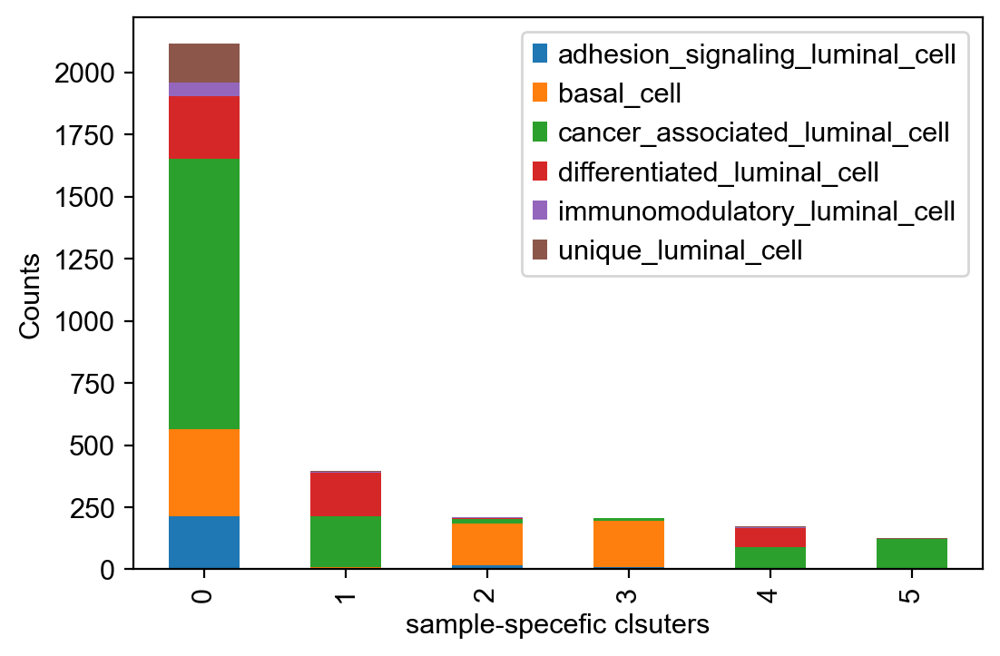

In [23]:
data = pd.crosstab(adata.obs['clusters'], adata.obs['SCT_snn_res.0.2']).transpose()

# Plot the stacked bar chart
plt.figure(figsize=(10, 6))
data.plot(kind='bar', stacked=True)
plt.xlabel('sample-specefic clsuters')
plt.ylabel('Counts')
plt.title('')
plt.legend(loc='upper right')
# Save the plot as an image file
plt.savefig('./figures/srr12603785_frequency_sample_clsuter_in_cell_clusters.png')

plt.show()

computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
saving figure to file ./figures/scvelo_srr12603785_velocity_stream.png


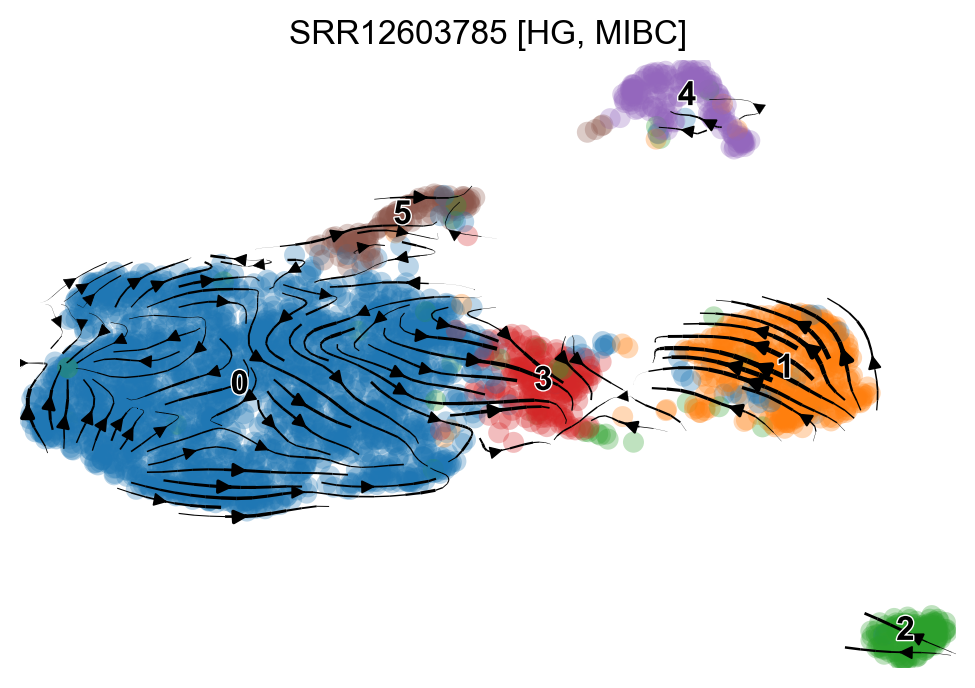

In [24]:
scv.pl.velocity_embedding_stream(adata, basis="umap", color="SCT_snn_res.0.2", title= 'SRR12603785 [HG, MIBC]', save= 'srr12603785_velocity_stream.png')

computing terminal states
    identified 1 region of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)


C:\Users\qaedi\anaconda3\lib\site-packages\scvelo\plotting\utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


saving figure to file ./figures/scvelo_srr12603785_latent_time.png


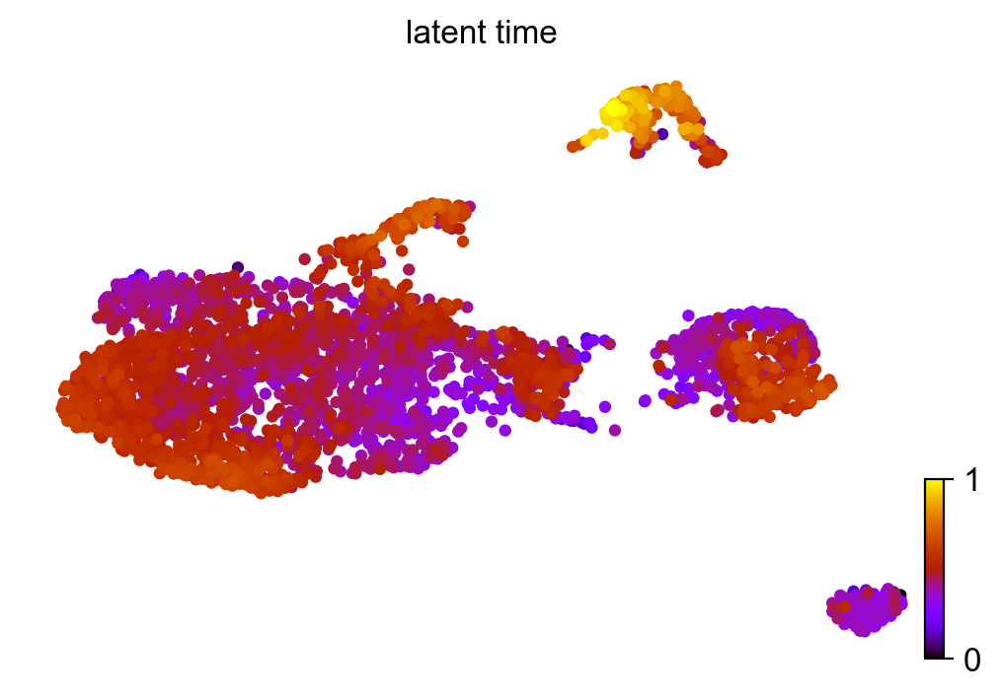

In [25]:
#latent time analysis
scv.tl.latent_time(adata)
scv.pl.scatter(adata, color='latent_time', color_map='gnuplot', size=80, save= "srr12603785_latent_time.png")

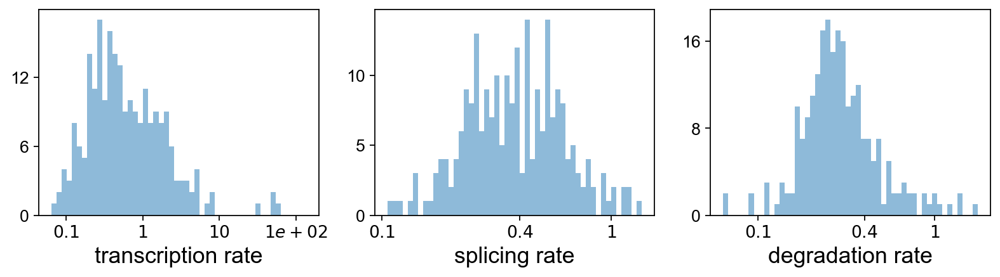

,fit_r2,fit_alpha,fit_beta,fit_gamma,fit_t_,fit_scaling,fit_std_u,fit_std_s,fit_likelihood,fit_u0,fit_s0,fit_pval_steady,fit_steady_u,fit_steady_s,fit_variance,fit_alignment_scaling
ENO1,0.024877,10.734284,19.740247,0.231509,11.851128,0.010782,0.202709,8.741940,0.216566,0.0,0.0,0.497006,0.631204,27.909085,1.059768,2.108890
ALDH4A1,0.286058,0.444915,2.008363,0.307777,12.027155,0.266230,0.082529,0.417716,0.242571,0.0,0.0,0.412720,0.229362,1.113887,0.832797,2.400162
CAMK2N1,0.113780,1.487340,15.652569,0.421167,8.500933,0.015304,0.023313,0.708381,0.157530,0.0,0.0,0.493493,0.080282,2.454103,1.906624,1.829285
TCEA3,0.209525,0.252850,3.445939,0.217210,7.403041,0.188500,0.026572,0.199820,0.179024,0.0,0.0,0.358420,0.079981,0.526023,0.956051,2.182247
MYCBP,0.079217,0.354019,1.455002,0.124827,7.001694,0.167717,0.039586,0.334571,0.108331,0.0,0.0,0.496046,0.207549,1.099629,2.136724,4.978926


In [26]:
# Kinetic rate parameters
df = adata.var
df = df[(df['fit_likelihood'] > .1) & df['velocity_genes'] == True]

kwargs = dict(xscale='log', fontsize=16)
with scv.GridSpec(ncols=3) as pl:
    pl.hist(df['fit_alpha'], xlabel='transcription rate', **kwargs)
    pl.hist(df['fit_beta'] * df['fit_scaling'], xlabel='splicing rate', xticks=[.1, .4, 1], **kwargs)
    pl.hist(df['fit_gamma'], xlabel='degradation rate', xticks=[.1, .4, 1], **kwargs)

scv.get_df(adata, 'fit*', dropna=True).head()

saving figure to file ./figures/scvelo_heatmap_srr12603785_top_genes_kinetic_parameters.png


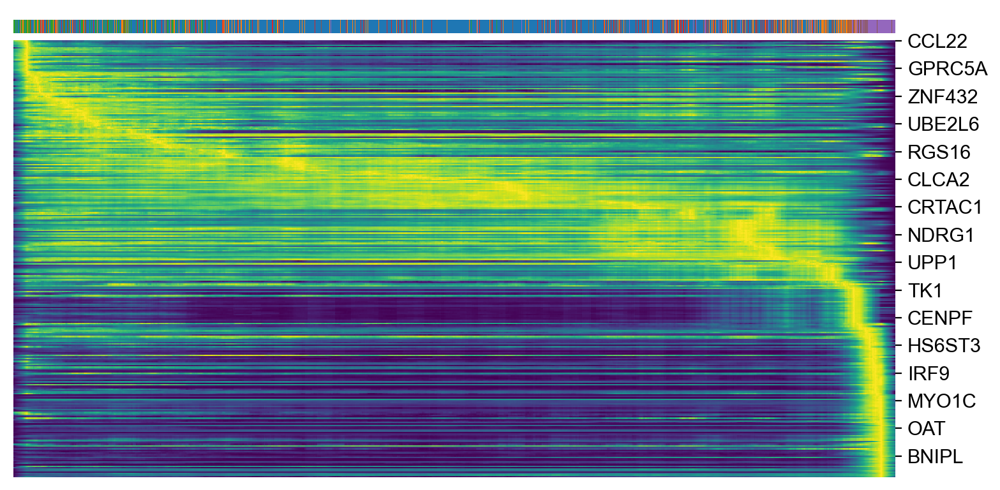

In [27]:
# top genes
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index[:300]
scv.pl.heatmap(adata, var_names=top_genes, sortby='latent_time', col_color="SCT_snn_res.0.2", n_convolve=100 ,colorbar=True, save= "srr12603785_top_genes_kinetic_parameters.png")

In [28]:
# reading file
adata = scv.read("SRR12603785.h5ad")
# Define a dictionary mapping the numbers to labels
label_mapping = {
    0: 'basal_cell',
    1: 'cancer_associated_luminal_cell',
    2: 'differentiated_luminal_cell',
    3: 'unique_luminal_cell',
    4: 'immunomodulatory_luminal_cell',
    5: 'adhesion_signaling_luminal_cell'
}

# Replace the numbers with their corresponding labels
adata.obs['clusters'] =adata.obs['clusters'].replace(label_mapping)
scv.pp.filter_and_normalize(adata, min_shared_counts=20, n_top_genes=2000)
scv.pp.moments(adata, n_pcs=30, n_neighbors=30)


scv.tl.recover_dynamics(adata)
scv.tl.velocity(adata, mode='dynamical')
scv.tl.velocity_graph(adata)
print(pd.crosstab(adata.obs['clusters'], adata.obs['SCT_snn_res.0.1']))
print(pd.crosstab(adata.obs['clusters'], adata.obs['SCT_snn_res.0.2']))
print(pd.crosstab(adata.obs['clusters'], adata.obs['SCT_snn_res.0.4']))


Filtered out 29100 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.
Logarithmized X.
computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics (using 1/16 cores)


  0%|          | 0/375 [00:00<?, ?gene/s]

    finished (0:02:22) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/16 cores)


  0%|          | 0/3226 [00:00<?, ?cells/s]

    finished (0:00:04) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
SCT_snn_res.0.1                     0    1    2   3    4
clusters                                                
adhesion_signaling_luminal_cell   224    1   18   0    1
basal_cell                        540    9  164   6    4
cancer_associated_luminal_cell   1101  204   15  82  117
differentiated_luminal_cell       256  172    2  77    1
immunomodulatory_luminal_cell      55    5    2   6    0
unique_luminal_cell               156    3    0   2    3
SCT_snn_res.0.2                     0    1    2    3   4    5
clusters                                                     
adhesion_signaling_luminal_cell   214    1   18   10   0    1
basal_cell                        350    9  168  186   6    4
cancer_associated_luminal_cell   1089  205   17    9  82  117
differentiated_luminal_cell       252  172    4    2  77    1
immunomodulatory_luminal_cell      55    5    2    0   6    0
uni

<Figure size 1000x600 with 0 Axes>

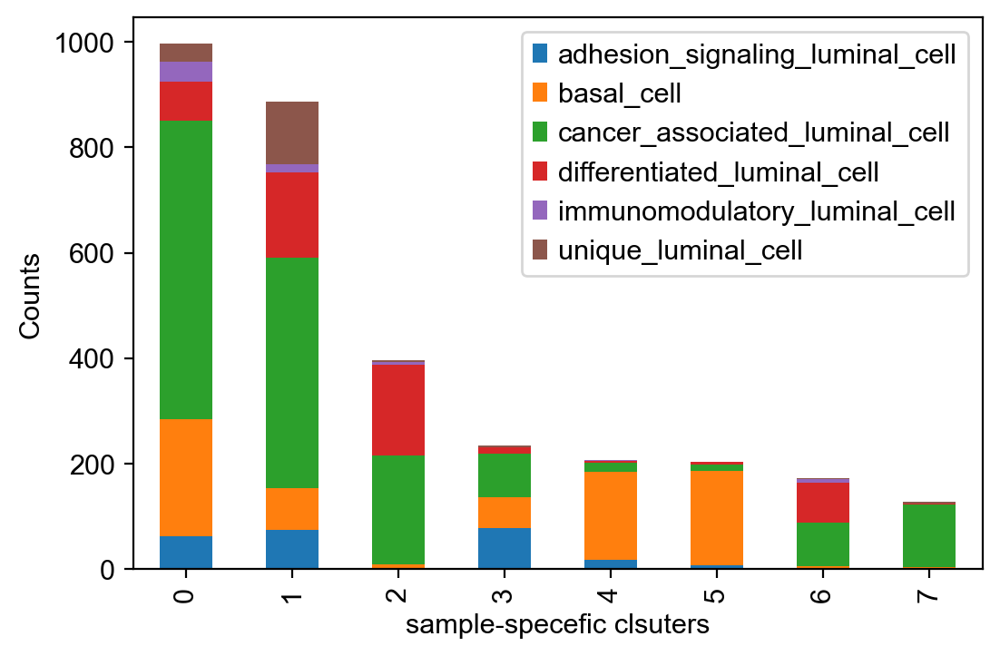

In [29]:
data = pd.crosstab(adata.obs['clusters'], adata.obs['SCT_snn_res.0.4']).transpose()

# Plot the stacked bar chart
plt.figure(figsize=(10, 6))
data.plot(kind='bar', stacked=True)
plt.xlabel('sample-specefic clsuters')
plt.ylabel('Counts')
plt.title('')
plt.legend(loc='upper right')
# Save the plot as an image file
plt.savefig('./figures/srr12603786_frequency_sample_clsuter_in_cell_clusters.png')

plt.show()

computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
saving figure to file ./figures/scvelo_srr12603786_velocity_stream.png


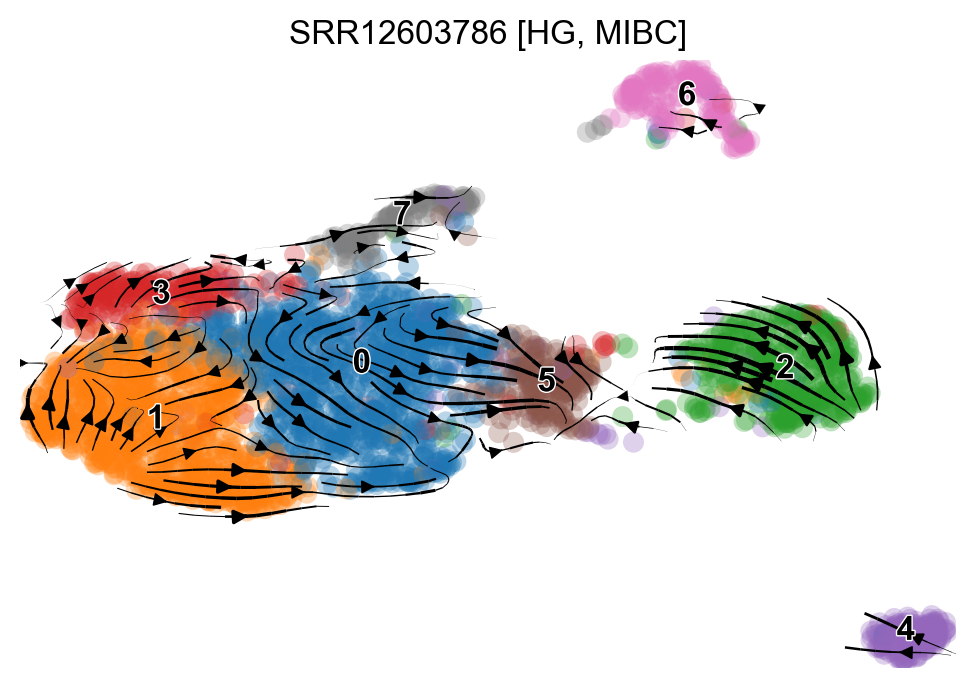

In [30]:
scv.pl.velocity_embedding_stream(adata, basis="umap", color="SCT_snn_res.0.4", title= 'SRR12603786 [HG, MIBC]', save= 'srr12603786_velocity_stream.png')

computing terminal states
    identified 1 region of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)


C:\Users\qaedi\anaconda3\lib\site-packages\scvelo\plotting\utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


saving figure to file ./figures/scvelo_srr12603786_latent_time.png


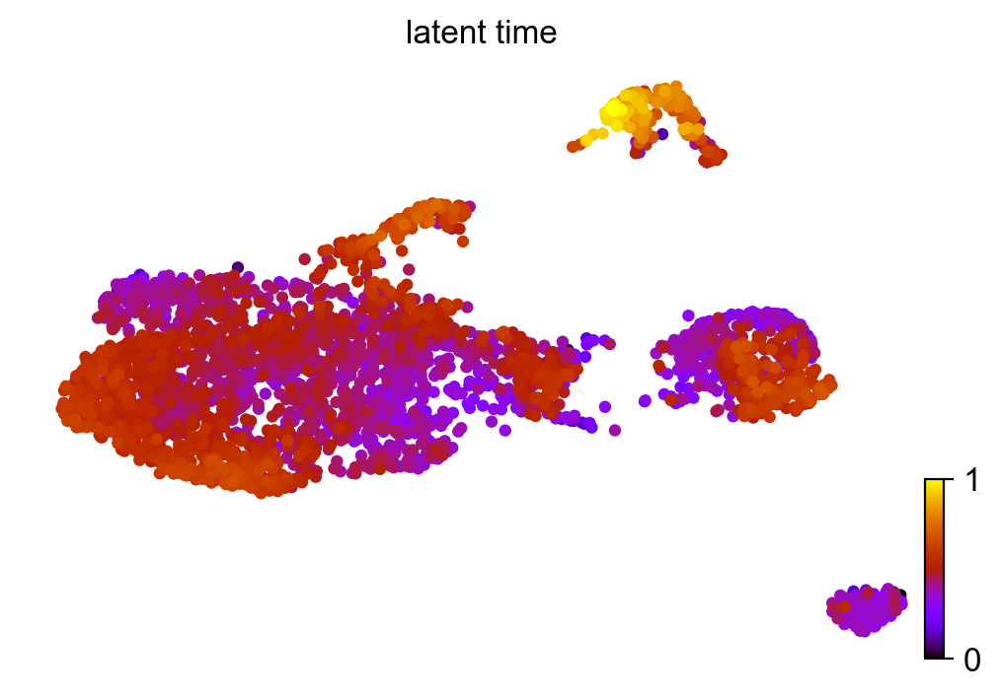

In [31]:
#latent time analysis
scv.tl.latent_time(adata)
scv.pl.scatter(adata, color='latent_time', color_map='gnuplot', size=80, save= "srr12603786_latent_time.png")

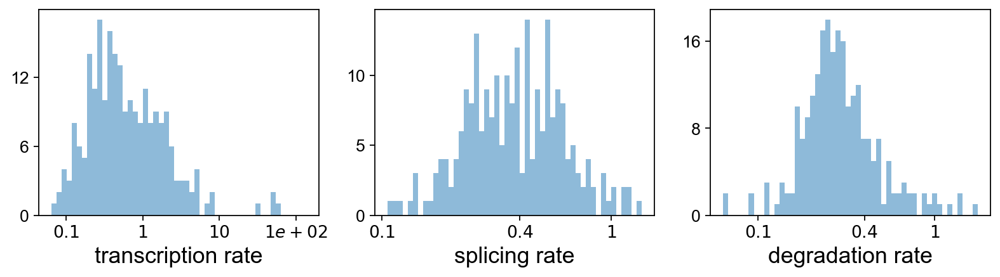

,fit_r2,fit_alpha,fit_beta,fit_gamma,fit_t_,fit_scaling,fit_std_u,fit_std_s,fit_likelihood,fit_u0,fit_s0,fit_pval_steady,fit_steady_u,fit_steady_s,fit_variance,fit_alignment_scaling
ENO1,0.024877,10.734284,19.740247,0.231509,11.851128,0.010782,0.202709,8.741940,0.216566,0.0,0.0,0.497006,0.631204,27.909085,1.059768,2.108890
ALDH4A1,0.286058,0.444915,2.008363,0.307777,12.027155,0.266230,0.082529,0.417716,0.242571,0.0,0.0,0.412720,0.229362,1.113887,0.832797,2.400162
CAMK2N1,0.113780,1.487340,15.652569,0.421167,8.500933,0.015304,0.023313,0.708381,0.157530,0.0,0.0,0.493493,0.080282,2.454103,1.906624,1.829285
TCEA3,0.209525,0.252850,3.445939,0.217210,7.403041,0.188500,0.026572,0.199820,0.179024,0.0,0.0,0.358420,0.079981,0.526023,0.956051,2.182247
MYCBP,0.079217,0.354019,1.455002,0.124827,7.001694,0.167717,0.039586,0.334571,0.108331,0.0,0.0,0.496046,0.207549,1.099629,2.136724,4.978926


In [32]:
# Kinetic rate parameters
df = adata.var
df = df[(df['fit_likelihood'] > .1) & df['velocity_genes'] == True]

kwargs = dict(xscale='log', fontsize=16)
with scv.GridSpec(ncols=3) as pl:
    pl.hist(df['fit_alpha'], xlabel='transcription rate', **kwargs)
    pl.hist(df['fit_beta'] * df['fit_scaling'], xlabel='splicing rate', xticks=[.1, .4, 1], **kwargs)
    pl.hist(df['fit_gamma'], xlabel='degradation rate', xticks=[.1, .4, 1], **kwargs)

scv.get_df(adata, 'fit*', dropna=True).head()

saving figure to file ./figures/scvelo_heatmap_srr12603786_top_genes_kinetic_parameters.png


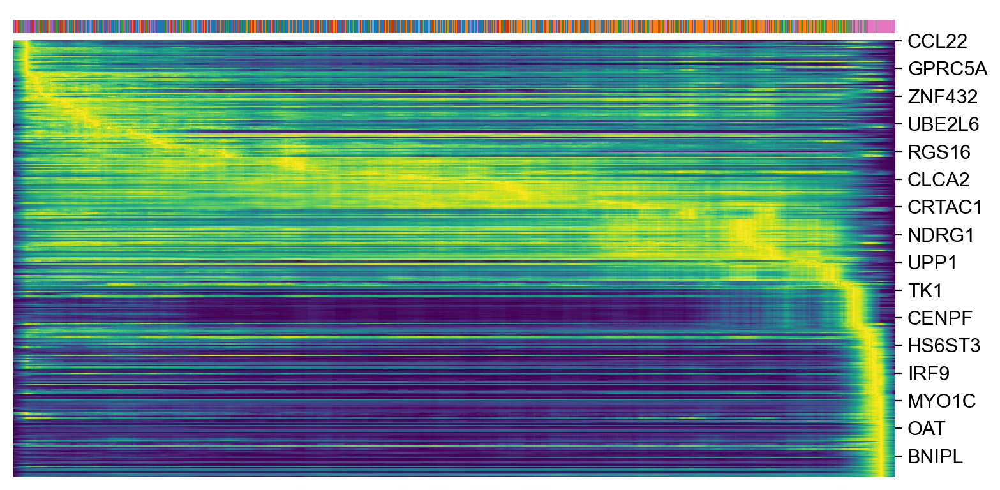

In [33]:
# top genes
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index[:300]
scv.pl.heatmap(adata, var_names=top_genes, sortby='latent_time', col_color="SCT_snn_res.0.4", n_convolve=100 ,colorbar=True, save= "srr12603786_top_genes_kinetic_parameters.png")

In [20]:
# reading file
adata = scv.read("SRR12603787.h5ad")
# Define a dictionary mapping the numbers to labels
label_mapping = {
    0: 'basal_cell',
    1: 'cancer_associated_luminal_cell',
    2: 'differentiated_luminal_cell',
    3: 'unique_luminal_cell',
    4: 'immunomodulatory_luminal_cell',
    5: 'adhesion_signaling_luminal_cell'
}

# Replace the numbers with their corresponding labels
adata.obs['clusters'] =adata.obs['clusters'].replace(label_mapping)
scv.pp.filter_and_normalize(adata, min_shared_counts=20, n_top_genes=2000)
scv.pp.moments(adata, n_pcs=30, n_neighbors=30)
scv.tl.velocity(adata)
scv.tl.velocity_graph(adata)
print(pd.DataFrame(pd.crosstab(adata.obs['clusters'], adata.obs['SCT_snn_res.0.1'])))
print(pd.crosstab(adata.obs['clusters'], adata.obs['SCT_snn_res.0.2']))
print(pd.crosstab(adata.obs['clusters'], adata.obs['SCT_snn_res.0.4']))


Filtered out 33648 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.
Logarithmized X.
computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/16 cores)


  0%|          | 0/299 [00:00<?, ?cells/s]

    finished (0:00:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
SCT_snn_res.0.1                   0   1
clusters                               
adhesion_signaling_luminal_cell  19  45
basal_cell                       39  20
cancer_associated_luminal_cell   33   1
differentiated_luminal_cell      92   2
immunomodulatory_luminal_cell    14   0
unique_luminal_cell              34   0
SCT_snn_res.0.2                   0   1
clusters                               
adhesion_signaling_luminal_cell   8  56
basal_cell                       16  43
cancer_associated_luminal_cell   31   3
differentiated_luminal_cell      91   3
immunomodulatory_luminal_cell    13   1
unique_luminal_cell              32   2
SCT_snn_res.0.4                   0   1   2
clusters                                   
adhesion_signaling_luminal_cell  18   1  45
basal_cell                       32   7  20
cancer_associated_luminal_cell   16  17   1
differentiated_luminal_cell      

computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


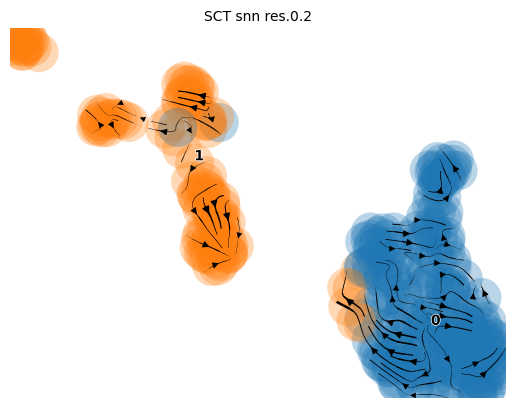

In [21]:
scv.pl.velocity_embedding_stream(adata, basis="umap", color="SCT_snn_res.0.2")

In [22]:
# reading file
adata = scv.read("SRR12603789.h5ad")
# Define a dictionary mapping the numbers to labels
label_mapping = {
    0: 'basal_cell',
    1: 'cancer_associated_luminal_cell',
    2: 'differentiated_luminal_cell',
    3: 'unique_luminal_cell',
    4: 'immunomodulatory_luminal_cell',
    5: 'adhesion_signaling_luminal_cell'
}

# Replace the numbers with their corresponding labels
adata.obs['clusters'] =adata.obs['clusters'].replace(label_mapping)
scv.pp.filter_and_normalize(adata, min_shared_counts=20, n_top_genes=2000)
scv.pp.moments(adata, n_pcs=30, n_neighbors=30)
scv.tl.velocity(adata)
scv.tl.velocity_graph(adata)
print(pd.DataFrame(pd.crosstab(adata.obs['clusters'], adata.obs['SCT_snn_res.0.1'])))
print(pd.crosstab(adata.obs['clusters'], adata.obs['SCT_snn_res.0.2']))
print(pd.crosstab(adata.obs['clusters'], adata.obs['SCT_snn_res.0.4']))


Filtered out 30966 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.
Logarithmized X.
computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/16 cores)


  0%|          | 0/1135 [00:00<?, ?cells/s]

    finished (0:00:01) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
SCT_snn_res.0.1                    0    1   2   3
clusters                                         
adhesion_signaling_luminal_cell   24  107   0   1
basal_cell                       479   20   0  31
cancer_associated_luminal_cell    29   21   1   0
differentiated_luminal_cell        7   42  68   1
immunomodulatory_luminal_cell      1  101   0   0
unique_luminal_cell               16  186   0   0
SCT_snn_res.0.2                    0    1    2   3   4   5
clusters                                                  
adhesion_signaling_luminal_cell   59   12   10  50   0   1
basal_cell                        21  330  142   6   0  31
cancer_associated_luminal_cell    18   11   18   3   1   0
differentiated_luminal_cell       11    3    4  31  68   1
immunomodulatory_luminal_cell    101    0    1   0   0   0
unique_luminal_cell              188    6    8   0   0   0
SCT_snn_res.0.4      

computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


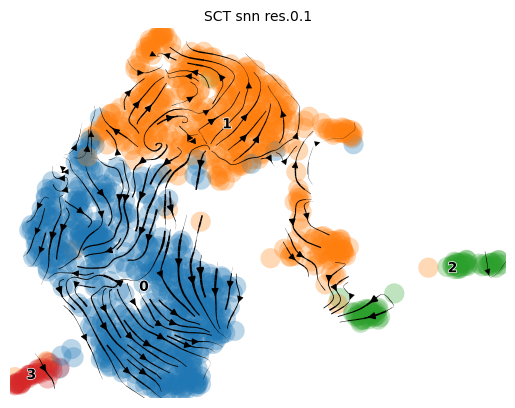

In [23]:
scv.pl.velocity_embedding_stream(adata, basis="umap", color="SCT_snn_res.0.1")

In [24]:
# reading file
adata = scv.read("SRR12603790.h5ad")
# Define a dictionary mapping the numbers to labels
label_mapping = {
    0: 'basal_cell',
    1: 'cancer_associated_luminal_cell',
    2: 'differentiated_luminal_cell',
    3: 'unique_luminal_cell',
    4: 'immunomodulatory_luminal_cell',
    5: 'adhesion_signaling_luminal_cell'
}

# Replace the numbers with their corresponding labels
adata.obs['clusters'] =adata.obs['clusters'].replace(label_mapping)
scv.pp.filter_and_normalize(adata, min_shared_counts=20, n_top_genes=2000)
scv.pp.moments(adata, n_pcs=30, n_neighbors=30)
scv.tl.velocity(adata)
scv.tl.velocity_graph(adata)
print(pd.DataFrame(pd.crosstab(adata.obs['clusters'], adata.obs['SCT_snn_res.0.1'])))
print(pd.crosstab(adata.obs['clusters'], adata.obs['SCT_snn_res.0.2']))
print(pd.crosstab(adata.obs['clusters'], adata.obs['SCT_snn_res.0.4']))


Filtered out 31545 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.
Logarithmized X.
computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/16 cores)


  0%|          | 0/810 [00:00<?, ?cells/s]

    finished (0:00:01) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
SCT_snn_res.0.1                    0    1
clusters                                 
adhesion_signaling_luminal_cell   43   38
basal_cell                       233   78
cancer_associated_luminal_cell    66   54
differentiated_luminal_cell       24  116
immunomodulatory_luminal_cell     48    8
unique_luminal_cell               95    7
SCT_snn_res.0.2                    0    1   2
clusters                                     
adhesion_signaling_luminal_cell   38   18  25
basal_cell                        78  225   8
cancer_associated_luminal_cell    55   40  25
differentiated_luminal_cell      116    2  22
immunomodulatory_luminal_cell      9    2  45
unique_luminal_cell                7    7  88
SCT_snn_res.0.4                    0   1   2   3   4
clusters                                            
adhesion_signaling_luminal_cell   18  35  12   4  12
basal_cell                    

computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


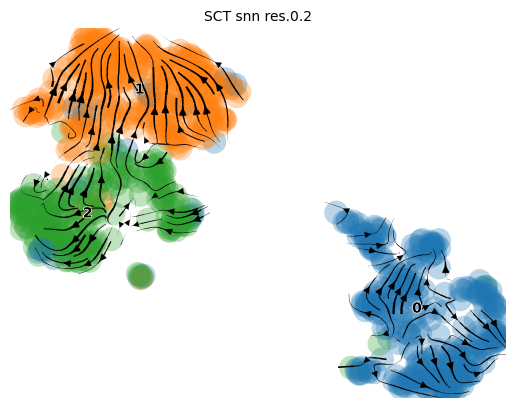

In [25]:
scv.pl.velocity_embedding_stream(adata, basis="umap", color="SCT_snn_res.0.2")